## This notebook will analyze the effect consecutive muscimol injections have on firing rate

In [ ]:
# to add deps:
# !uv add npc_sessions --optional dr -q

In [ ]:
!uv sync --extra dr -q
# restart kernel after running!

In [1]:
%pip install -U npc_lims

import os
import pickle
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import scipy.stats as st
import datetime
import zoneinfo

import npc_sessions
import numpy as np
import npc_lims
from npc_sessions import DynamicRoutingSession
from dynamic_routing_analysis import data_utils, spike_utils

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 24.1.2 -> 25.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip
c:\Users\vayle.lafehr\AppData\Local\anaconda3\envs\dr_analysis\Lib\site-packages\requests\__init__.py:86: RequestsDependencyWarning: Unable to find acceptable character detection dependency (chardet or charset_normalizer).
  warnings.warn(


In [ ]:
muscimol_tracking = pd.read_excel(r"C:\Users\vayle.lafehr\Desktop\Ephys Experiment Tracking (1).xlsx", sheet_name = 'by_session_muscimol')

In [2]:
import npc_sessions

aggregated_sessions = [(762526, '20250318'), (762526, '20250319'), (762526, '20250320'),(762526, '20250321')]
ephys_sessions = ['762526_2025-03-18', '762526_2025-03-19', '762526_2025-03-20', '762526_2025-03-21']

c:\Users\vayle.lafehr\AppData\Local\anaconda3\envs\dr_analysis\Lib\site-packages\requests\__init__.py:86: RequestsDependencyWarning: Unable to find acceptable character detection dependency (chardet or charset_normalizer).
  warnings.warn(


4.3652334974872256
1.6740599750937213
2.3392067101330922
2.9710547655098782


C:\Users\vayle.lafehr\AppData\Local\Temp\ipykernel_11160\2436222861.py:17: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


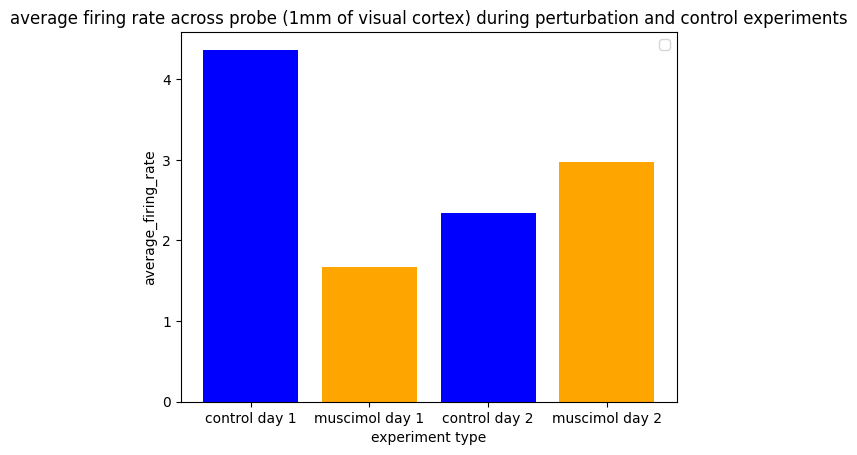

In [7]:
probe = 'Probe E'

for session in ephys_sessions:
    adaptations_metrics_probeB = npc_sessions.Session(session).sorted_data.quality_metrics_df(probe)
    print
    adaptations_FR = adaptations_metrics_probeB['firing_rate']
    print(adaptations_FR.mean())

import matplotlib.pyplot as plt
experiment_type = ['control day 1', 'muscimol day 1', 'control day 2', 'muscimol day 2']
values = [4.3652334974872256, 1.6740599750937213, 2.3392067101330922, 2.9710547655098782]

plt.bar(experiment_type, values, color=['blue', 'orange', 'blue', 'orange'])
plt.title('average firing rate across probe (1mm of visual cortex) during perturbation and control experiments')
plt.xlabel('experiment type')
plt.ylabel('average_firing_rate')
plt.legend()
plt.show()

In [ ]:
print(len(adaptations_metrics_probeB))

In [ ]:
session = '754852_2025-02-10'
adaptations_probeB = npc_sessions.Session(session).sorted_data.quality_metrics_df(probe)
adaptations_FR = adaptations_probeB['firing_rate']
print(adaptations_FR.mean())

In [ ]:
x = pd.DataFrame(adaptations_FR)

In [ ]:
#apply quality metrics

probe = 'Probe B'

for session in ephys_sessions:
    adaptations_probeB = npc_sessions.Session(session).sorted_data.quality_metrics_df(probe)
    muscimol_unit_locations = (npc_sessions.Session(session)).sorted_data.unit_locations(probe)
    adaptations_probeB['dv_position'] = muscimol_unit_locations[:, 1]
    qc_adaptations_units_probeB = adaptations_probeB.query(('amplitude_cutoff < 0.1') and ('presence_ratio >= 0.95') and ('isi_violations_ratio < 0.5'))
    adaptations_FR = qc_adaptations_units_probeB['firing_rate']
    # print(adaptations_FR)
    print(adaptations_FR.mean())

import matplotlib.pyplot as plt
experiment_type = ['control day 1', 'muscimol day 1', 'control day 2', 'muscimol day 2']
values = [4.835023536484474, 2.594615759861764, 4.788356179988589, 5.217816449712439]

plt.bar(experiment_type, values, color=['blue', 'orange', 'blue', 'orange'])
plt.title('average firing rate with applied qc metrics across probe (1mm of visual cortex) during perturbation and control experiments')
plt.xlabel('experiment type')
plt.ylabel('average_firing_rate')
plt.legend()
plt.show()


    

In [ ]:
brain_surface = 3000
injection_depth = 700

In [ ]:
#apply injection depth filtering
firing_rates_avg = []
probe = 'probeB'
adaptations_sessions = ['754852_2025-02-11', '754852_2025-02-12', '754852_2025-02-13']

for session_id in adaptations_sessions:
    adaptations_units_probeB = npc_sessions.Session(session_id).sorted_data.quality_metrics_df(probe)
    adaptations_FR = adaptations_units_probeB['firing_rate']
    firing_rate_adaptations = pd.DataFrame(adaptations_FR)
    print(adaptations_FR)
    print(adaptations_FR.mean())

    # avg_FR_inj = adaptations_FR.mean()

    # avg_FR_inj.rename(columns={0:'avg_firing_rate'})
    # avg_FR_inj.reset_index(drop=True)
    # firing_rates_avg.append(avg_FR_inj)


In [ ]:
avg_inj_FR_list = [4.48182331986018, 1.584967832274796, 4.0958739147035335, 1.2898476787986817]

#calculate suppression
day_1_suppression = abs(avg_inj_FR_list[1] - avg_inj_FR_list[0])
day_2_suppression = abs(avg_inj_FR_list[3] - avg_inj_FR_list[2])


import matplotlib.pyplot as plt
experiment_type = ['first perturbation', 'second perturbation']
values = [day_1_suppression, day_2_suppression]

plt.bar(experiment_type, values, color=['green', 'pink'])

plt.title('average suppression of firing rate between perturbation days (whole length of probe)')
plt.xlabel('experiment type')
plt.ylabel('avg_firing_rate suppression')
plt.legend()
plt.show()


In [ ]:
#apply is_spontaneous vs is_mapping vs both

print(npc_sessions.Session(session).sorted_data.quality_metrics_df(probe))

In [ ]:
adaptations_sessions = ['754852_2025-02-11', '754852_2025-02-12', '754852_2025-02-13']
stim_names = ['RFMapping','Spontaneous'] 
            #   'Spontaneous']

#add parameters for analysis: calculate the range of channels around the peak channel at injection depth
injection_depth = 700 # um
probe_insertion_depth = 1000 # um
closest_channel = int((probe_insertion_depth - injection_depth ) / 20 * 2) # 2 channels per row, 20 um between rows
below_injection = int(150 / 20 * 2)
above_injection = int(500 / 20 * 2)

#make a loop that goes through each session in list of sessions of interest, create session_id object for easy access, then apply unit filtering metrics like the range of channels and probe of
#interest to the units, then restrict search further to stimulus periods of interest and use loop to pull out start and stop times, then create an 
#for idx, row itterrows loop to go through and apply the period constraints to the units, finally append this information to a dictionary, then append dict to results list so that the info that
#corresponds to each session is a dict nested in a list of sessions!
for session_id in adaptations_sessions:
    print(session_id)
    session = npc_sessions.Session(session_id)
    units = (
        session.units[:]
        .query('electrode_group_name == "probeB"')
        # .query('peak_channel >= @closest_channel - @below_injection')    
        # .query('peak_channel <= @closest_channel + @above_injection')    
    )
    for stim_name in stim_names:
        session_epochs = session.epochs[:]
        epoch_info = dict(session_epochs.query(f'stim_name == "{stim_name}"').iloc[0])
        # query_str = f'stim_name == "{stim_name}"'
        # result = session_epochs.query(query_str)
        start_time = epoch_info['start_time']
        stop_time = epoch_info['stop_time']
        print(start_time)
        print(stop_time)

In [54]:
#make this one loop through probes as well
results_1 = []  
adaptations_sessions = ['762526_2025-03-18','762526_2025-03-19', '762526_2025-03-20', '762526_2025-03-21']
stim_names = ['Spontaneous', 'DynamicRouting1']
all_unit_ids = set()
electrode_groups = ["probeE", "probeB", "probeC"]

#add parameters for analysis: calculate the range of channels around the peak channel at injection depth
injection_depth = 700 # um
probe_insertion_depth = 3000 # um
closest_channel = int((probe_insertion_depth - injection_depth ) / 20 * 2) # 2 channels per row, 20 um between rows
below_injection = int(500 / 20 * 2)
above_injection = int(500 / 20 * 2)

unique_units_per_session = {}

#make a loop that goes through each session in list of sessions of interest, create session_id object for easy access, then apply unit filtering metrics like the range of channels and probe of
#interest to the units, then restrict search further to stimulus periods of interest and use loop to pull out start and stop times, then create an 
#for idx, row itterrows loop to go through and apply the period constraints to the units, finally append this information to a dictionary, then append dict to results list so that the info that
#corresponds to each session is a dict nested in a list of sessions!


for session_id in adaptations_sessions:
        print(session_id)
        session = npc_sessions.Session(session_id)
        unique_unit_ids = set()
        for electrode_group in electrode_groups:
            units = (
            session.units[:]
            .query(f'electrode_group_name == "{electrode_group}"')
            .query('peak_channel >= @closest_channel - @below_injection')    
            .query('peak_channel <= @closest_channel + @above_injection')    
        )

        

            for stim_name in stim_names:
                    session_epochs = session.epochs[:]
                    epoch_info = dict(session_epochs.query(f'stim_name == "{stim_name}"').iloc[0])
                    start_time = epoch_info['start_time']
                    stop_time = epoch_info['stop_time']
                    for _, row in units.iterrows():
                        spike_times = np.array(row['spike_times'])
                        times_in_epoch = spike_times[(spike_times >= start_time) & (spike_times <= stop_time)]

                        result = dict(
                            session_id=session_id,
                            peak_channel=row['peak_channel'],
                            unit_id=row['unit_id'],
                            stim_name=stim_name,
                            spike_count=len(times_in_epoch),
                            stim_len=stop_time - start_time,
                            spikes_per_sec=((len(times_in_epoch))/(stop_time - start_time)),
                            )
                        unique_units_per_session[session_id] = len(unique_unit_ids)
                        unique_unit_ids.add(row['unit_id'])
                        results_1.append(result)
                # print(result)\



results_df_1 = pd.DataFrame(results_1)
print(results_df_1)

762526_2025-03-18


fetching units: 100%|█████████████████████████| 3/3 [00:06<00:00,  2.22s/device]
c:\Users\vayle.lafehr\AppData\Local\anaconda3\envs\dr_analysis\Lib\site-packages\numcodecs\abc.py:107: UserWarning: Multi-threading is supported for wavpack version>=5.6.4, but current version is 5.5.0. Parallel decoding will not be available.
  return cls(**config)
c:\Users\vayle.lafehr\AppData\Local\anaconda3\envs\dr_analysis\Lib\site-packages\numcodecs\abc.py:107: UserWarning: Multi-threading is supported for wavpack version>=5.6.4, but current version is 5.5.0. Parallel decoding will not be available.
  return cls(**config)
c:\Users\vayle.lafehr\AppData\Local\anaconda3\envs\dr_analysis\Lib\site-packages\numcodecs\abc.py:107: UserWarning: Multi-threading is supported for wavpack version>=5.6.4, but current version is 5.5.0. Parallel decoding will not be available.
  return cls(**config)


762526_2025-03-19


fetching units: 100%|█████████████████████████| 3/3 [00:09<00:00,  3.27s/device]
c:\Users\vayle.lafehr\AppData\Local\anaconda3\envs\dr_analysis\Lib\site-packages\numcodecs\abc.py:107: UserWarning: Multi-threading is supported for wavpack version>=5.6.4, but current version is 5.5.0. Parallel decoding will not be available.
  return cls(**config)
c:\Users\vayle.lafehr\AppData\Local\anaconda3\envs\dr_analysis\Lib\site-packages\numcodecs\abc.py:107: UserWarning: Multi-threading is supported for wavpack version>=5.6.4, but current version is 5.5.0. Parallel decoding will not be available.
  return cls(**config)
c:\Users\vayle.lafehr\AppData\Local\anaconda3\envs\dr_analysis\Lib\site-packages\numcodecs\abc.py:107: UserWarning: Multi-threading is supported for wavpack version>=5.6.4, but current version is 5.5.0. Parallel decoding will not be available.
  return cls(**config)


762526_2025-03-20


fetching units: 100%|█████████████████████████| 3/3 [00:10<00:00,  3.48s/device]
c:\Users\vayle.lafehr\AppData\Local\anaconda3\envs\dr_analysis\Lib\site-packages\numcodecs\abc.py:107: UserWarning: Multi-threading is supported for wavpack version>=5.6.4, but current version is 5.5.0. Parallel decoding will not be available.
  return cls(**config)
c:\Users\vayle.lafehr\AppData\Local\anaconda3\envs\dr_analysis\Lib\site-packages\numcodecs\abc.py:107: UserWarning: Multi-threading is supported for wavpack version>=5.6.4, but current version is 5.5.0. Parallel decoding will not be available.
  return cls(**config)
c:\Users\vayle.lafehr\AppData\Local\anaconda3\envs\dr_analysis\Lib\site-packages\numcodecs\abc.py:107: UserWarning: Multi-threading is supported for wavpack version>=5.6.4, but current version is 5.5.0. Parallel decoding will not be available.
  return cls(**config)
Stim block_idx=1 has len(diode_flips)=216853 diode flips, len(vsyncs)=216849 vsyncs:too great a difference to correct.

762526_2025-03-21


fetching units: 100%|█████████████████████████| 3/3 [00:07<00:00,  2.67s/device]
c:\Users\vayle.lafehr\AppData\Local\anaconda3\envs\dr_analysis\Lib\site-packages\numcodecs\abc.py:107: UserWarning: Multi-threading is supported for wavpack version>=5.6.4, but current version is 5.5.0. Parallel decoding will not be available.
  return cls(**config)
c:\Users\vayle.lafehr\AppData\Local\anaconda3\envs\dr_analysis\Lib\site-packages\numcodecs\abc.py:107: UserWarning: Multi-threading is supported for wavpack version>=5.6.4, but current version is 5.5.0. Parallel decoding will not be available.
  return cls(**config)
c:\Users\vayle.lafehr\AppData\Local\anaconda3\envs\dr_analysis\Lib\site-packages\numcodecs\abc.py:107: UserWarning: Multi-threading is supported for wavpack version>=5.6.4, but current version is 5.5.0. Parallel decoding will not be available.
  return cls(**config)


            session_id  peak_channel                  unit_id  \
0    762526_2025-03-18           194   762526_2025-03-18_E-54   
1    762526_2025-03-18           198   762526_2025-03-18_E-57   
2    762526_2025-03-18           202   762526_2025-03-18_E-58   
3    762526_2025-03-18           206   762526_2025-03-18_E-59   
4    762526_2025-03-18           208   762526_2025-03-18_E-60   
..                 ...           ...                      ...   
719  762526_2025-03-21           221   762526_2025-03-21_C-67   
720  762526_2025-03-21           229   762526_2025-03-21_C-69   
721  762526_2025-03-21           234   762526_2025-03-21_C-75   
722  762526_2025-03-21           218  762526_2025-03-21_C-152   
723  762526_2025-03-21           234  762526_2025-03-21_C-156   

           stim_name  spike_count     stim_len  spikes_per_sec  
0        Spontaneous          190   601.823355        0.315707  
1        Spontaneous         9321   601.823355       15.487933  
2        Spontaneous    

In [39]:
#make this one loop through probes as well
results = []  
adaptations_sessions = ['762526_2025-03-18','762526_2025-03-19', '762526_2025-03-20', '762526_2025-03-21']
stim_names = ['Spontaneous', 'DynamicRouting1']
all_unit_ids = set()
electrode_groups = ["probeB", "probeC"]

#add parameters for analysis: calculate the range of channels around the peak channel at injection depth
injection_depth = 700 # um
probe_insertion_depth = 3000 # um
closest_channel = int((probe_insertion_depth - injection_depth ) / 20 * 2) # 2 channels per row, 20 um between rows
below_injection = int(500 / 20 * 2)
above_injection = int(500 / 20 * 2)

unique_units_per_session = {}

#make a loop that goes through each session in list of sessions of interest, create session_id object for easy access, then apply unit filtering metrics like the range of channels and probe of
#interest to the units, then restrict search further to stimulus periods of interest and use loop to pull out start and stop times, then create an 
#for idx, row itterrows loop to go through and apply the period constraints to the units, finally append this information to a dictionary, then append dict to results list so that the info that
#corresponds to each session is a dict nested in a list of sessions!


for session_id in adaptations_sessions:
    print(session_id)
    session = npc_sessions.Session(session_id)

    for electrode in electrode_groups:
        units = (
            session.units[:]
            .query(f'electrode_group_name == "{electrode}"')
            .query('peak_channel >= @closest_channel - @below_injection')    
            .query('peak_channel <= @closest_channel + @above_injection')    
     )

        unique_unit_ids = set()

        for stim_name in stim_names:
            session_epochs = session.epochs[:]
            epoch_info = dict(session_epochs.query(f'stim_name == "{stim_name}"').iloc[0])
            start_time = epoch_info['start_time']
            stop_time = epoch_info['stop_time']
            for _, row in units.iterrows():
                spike_times = np.array(row['spike_times'])
                times_in_epoch = spike_times[(spike_times >= start_time) & (spike_times <= stop_time)]

                result = dict(
                    session_id=session_id,
                    peak_channel=row['peak_channel'],
                    unit_id=row['unit_id'],
                    stim_name=stim_name,
                    spike_count=len(times_in_epoch),
                    stim_len=stop_time - start_time,
                    spikes_per_sec=((len(times_in_epoch))/(stop_time - start_time)),
                    )
                unique_units_per_session[session_id] = len(unique_unit_ids)
                unique_unit_ids.add(row['unit_id'])
                results.append(result)
            # print(result)\



results_df = pd.DataFrame(results)
print(results_df)

762526_2025-03-18


fetching units: 100%|█████████████████████████| 3/3 [00:08<00:00,  2.74s/device]
c:\Users\vayle.lafehr\AppData\Local\anaconda3\envs\dr_analysis\Lib\site-packages\numcodecs\abc.py:107: UserWarning: Multi-threading is supported for wavpack version>=5.6.4, but current version is 5.5.0. Parallel decoding will not be available.
  return cls(**config)
c:\Users\vayle.lafehr\AppData\Local\anaconda3\envs\dr_analysis\Lib\site-packages\numcodecs\abc.py:107: UserWarning: Multi-threading is supported for wavpack version>=5.6.4, but current version is 5.5.0. Parallel decoding will not be available.
  return cls(**config)
c:\Users\vayle.lafehr\AppData\Local\anaconda3\envs\dr_analysis\Lib\site-packages\numcodecs\abc.py:107: UserWarning: Multi-threading is supported for wavpack version>=5.6.4, but current version is 5.5.0. Parallel decoding will not be available.
  return cls(**config)


762526_2025-03-19


fetching units: 100%|█████████████████████████| 3/3 [00:25<00:00,  8.66s/device]
c:\Users\vayle.lafehr\AppData\Local\anaconda3\envs\dr_analysis\Lib\site-packages\numcodecs\abc.py:107: UserWarning: Multi-threading is supported for wavpack version>=5.6.4, but current version is 5.5.0. Parallel decoding will not be available.
  return cls(**config)
c:\Users\vayle.lafehr\AppData\Local\anaconda3\envs\dr_analysis\Lib\site-packages\numcodecs\abc.py:107: UserWarning: Multi-threading is supported for wavpack version>=5.6.4, but current version is 5.5.0. Parallel decoding will not be available.
  return cls(**config)
c:\Users\vayle.lafehr\AppData\Local\anaconda3\envs\dr_analysis\Lib\site-packages\numcodecs\abc.py:107: UserWarning: Multi-threading is supported for wavpack version>=5.6.4, but current version is 5.5.0. Parallel decoding will not be available.
  return cls(**config)


762526_2025-03-20


fetching units: 100%|█████████████████████████| 3/3 [00:22<00:00,  7.40s/device]
c:\Users\vayle.lafehr\AppData\Local\anaconda3\envs\dr_analysis\Lib\site-packages\numcodecs\abc.py:107: UserWarning: Multi-threading is supported for wavpack version>=5.6.4, but current version is 5.5.0. Parallel decoding will not be available.
  return cls(**config)
c:\Users\vayle.lafehr\AppData\Local\anaconda3\envs\dr_analysis\Lib\site-packages\numcodecs\abc.py:107: UserWarning: Multi-threading is supported for wavpack version>=5.6.4, but current version is 5.5.0. Parallel decoding will not be available.
  return cls(**config)
c:\Users\vayle.lafehr\AppData\Local\anaconda3\envs\dr_analysis\Lib\site-packages\numcodecs\abc.py:107: UserWarning: Multi-threading is supported for wavpack version>=5.6.4, but current version is 5.5.0. Parallel decoding will not be available.
  return cls(**config)
Stim block_idx=1 has len(diode_flips)=216853 diode flips, len(vsyncs)=216849 vsyncs:too great a difference to correct.

762526_2025-03-21


fetching units: 100%|█████████████████████████| 3/3 [00:18<00:00,  6.01s/device]
c:\Users\vayle.lafehr\AppData\Local\anaconda3\envs\dr_analysis\Lib\site-packages\numcodecs\abc.py:107: UserWarning: Multi-threading is supported for wavpack version>=5.6.4, but current version is 5.5.0. Parallel decoding will not be available.
  return cls(**config)
c:\Users\vayle.lafehr\AppData\Local\anaconda3\envs\dr_analysis\Lib\site-packages\numcodecs\abc.py:107: UserWarning: Multi-threading is supported for wavpack version>=5.6.4, but current version is 5.5.0. Parallel decoding will not be available.
  return cls(**config)
c:\Users\vayle.lafehr\AppData\Local\anaconda3\envs\dr_analysis\Lib\site-packages\numcodecs\abc.py:107: UserWarning: Multi-threading is supported for wavpack version>=5.6.4, but current version is 5.5.0. Parallel decoding will not be available.
  return cls(**config)


            session_id  peak_channel                  unit_id  \
0    762526_2025-03-18           181   762526_2025-03-18_B-52   
1    762526_2025-03-18           185   762526_2025-03-18_B-53   
2    762526_2025-03-18           182   762526_2025-03-18_B-54   
3    762526_2025-03-18           185   762526_2025-03-18_B-55   
4    762526_2025-03-18           185   762526_2025-03-18_B-56   
..                 ...           ...                      ...   
479  762526_2025-03-21           221   762526_2025-03-21_C-67   
480  762526_2025-03-21           229   762526_2025-03-21_C-69   
481  762526_2025-03-21           234   762526_2025-03-21_C-75   
482  762526_2025-03-21           218  762526_2025-03-21_C-152   
483  762526_2025-03-21           234  762526_2025-03-21_C-156   

           stim_name  spike_count     stim_len  spikes_per_sec  
0        Spontaneous         1826   601.823355        3.034113  
1        Spontaneous         4911   601.823355        8.160202  
2        Spontaneous    

In [8]:
#create an empty list to store results, make epochs of session info into a df, create list of sessions of interest, create list of stimulus periods of interest
results = []  
adaptations_sessions = ['762526_2025-03-18','762526_2025-03-19', '762526_2025-03-20', '762526_2025-03-21']
stim_names = ['Spontaneous', 'DynamicRouting1']
all_unit_ids = set()

#add parameters for analysis: calculate the range of channels around the peak channel at injection depth
injection_depth = 700 # um
probe_insertion_depth = 3000 # um
closest_channel = int((probe_insertion_depth - injection_depth ) / 20 * 2) # 2 channels per row, 20 um between rows
below_injection = int(500 / 20 * 2)
above_injection = int(500 / 20 * 2)

unique_units_per_session = {}

#make a loop that goes through each session in list of sessions of interest, create session_id object for easy access, then apply unit filtering metrics like the range of channels and probe of
#interest to the units, then restrict search further to stimulus periods of interest and use loop to pull out start and stop times, then create an 
#for idx, row itterrows loop to go through and apply the period constraints to the units, finally append this information to a dictionary, then append dict to results list so that the info that
#corresponds to each session is a dict nested in a list of sessions!

for session_id in adaptations_sessions:
    print(session_id)
    session = npc_sessions.Session(session_id)
    session.trials[:]
#     units = (
#         session.units[:]
#         .query('electrode_group_name == "probeE"')
#         .query('peak_channel >= @closest_channel - @below_injection')    
#         .query('peak_channel <= @closest_channel + @above_injection')    
#     )

#     unique_unit_ids = set()

#     for stim_name in stim_names:
#         session_epochs = session.epochs[:]
#         epoch_info = dict(session_epochs.query(f'stim_name == "{stim_name}"').iloc[0])
#         start_time = epoch_info['start_time']
#         stop_time = epoch_info['stop_time']
#         for _, row in units.iterrows():
#             spike_times = np.array(row['spike_times'])
#             times_in_epoch = spike_times[(spike_times >= start_time) & (spike_times <= stop_time)]

#             result = dict(
#                 session_id=session_id,
#                 peak_channel=row['peak_channel'],
#                 unit_id=row['unit_id'],
#                 stim_name=stim_name,
#                 spike_count=len(times_in_epoch),
#                 stim_len=stop_time - start_time,
#                 spikes_per_sec=((len(times_in_epoch))/(stop_time - start_time)),
#                 )
#             unique_units_per_session[session_id] = len(unique_unit_ids)
#             unique_unit_ids.add(row['unit_id'])
#             results.append(result)
#             # print(result)



# results_df = pd.DataFrame(results)
# print(results_df)

762526_2025-03-18
762526_2025-03-19
762526_2025-03-20


Stim block_idx=1 has len(diode_flips)=216853 diode flips, len(vsyncs)=216849 vsyncs:too great a difference to correct. Returning display times based on vsync + constant lag.


762526_2025-03-21


In [ ]:
#calculate unit counts

unique_unit_counts = results_df.groupby('session_id')['unit_id'].nunique().reset_index()
unique_unit_counts.columns = ['session_id', 'unique_unit_count']

#merge the unique unit counts back into the results df
results_df = results_df.merge(unique_unit_counts, on='session_id', how='left')

print(results_df)

In [ ]:
results_df = pd.DataFrame(results)
results_df['spikes_per_sec'] = results_df['spike_count'].values / results_df['stim_len'].values
print(results_df)


In [ ]:
%debug

In [ ]:
tuple((session.ephys_record_node_dirs[0] / 'experiment1/recording1/events/Neuropix-PXI-100.ProbeA-AP/TTL').glob('*'))

In [ ]:
import upath
import numpy as np
import io

b = upath.UPath('s3://aind-private-data-prod-o5171v/ecephys_754852_2025-02-10_15-58-04/ecephys/ecephys_clipped/Record Node 104/experiment1/recording1/events/Neuropix-PXI-100.ProbeB-AP/TTL/sample_numbers.npy').read_bytes()
len(np.load(io.BytesIO(b)))

In [ ]:
b = upath.UPath('s3://aind-private-data-prod-o5171v/ecephys_754852_2025-02-11_16-14-43/ecephys/ecephys_clipped/Record Node 104/experiment1/recording1/events/Neuropix-PXI-100.ProbeA-AP/TTL/sample_numbers.npy').read_bytes()
len(np.load(io.BytesIO(b)))

In [ ]:
len(npc_sessions.Session('754852_2025-02-11').sync_data.get_line('barcode_ephys'))

In [ ]:
len(session.sync_data.get_line('barcode_ephys'))

Session ID: 762526_2025-03-18, Stimulus Period: Spontaneous, spikes/sec: 17.2874646970747
Session ID: 762526_2025-03-18, Stimulus Period: Spontaneous, spikes/sec: 2.196657855587539
Session ID: 762526_2025-03-18, Stimulus Period: Spontaneous, spikes/sec: 3.17368873235416
Session ID: 762526_2025-03-18, Stimulus Period: Spontaneous, spikes/sec: 0.4120810500648333
Session ID: 762526_2025-03-18, Stimulus Period: Spontaneous, spikes/sec: 1.9839708620056895
Session ID: 762526_2025-03-18, Stimulus Period: Spontaneous, spikes/sec: 2.4342691062297614
Session ID: 762526_2025-03-18, Stimulus Period: Spontaneous, spikes/sec: 0.08640409114262634
Session ID: 762526_2025-03-18, Stimulus Period: Spontaneous, spikes/sec: 9.615778373891898
Session ID: 762526_2025-03-18, Stimulus Period: Spontaneous, spikes/sec: 1.1348845048156497
Session ID: 762526_2025-03-18, Stimulus Period: Spontaneous, spikes/sec: 0.9853389624534119
Session ID: 762526_2025-03-18, Stimulus Period: Spontaneous, spikes/sec: 0.9587530882

C:\Users\vayle.lafehr\AppData\Local\Temp\ipykernel_31600\1215737110.py:19: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([control_day_1_task_results, control_day_1_spontaneous_results, perturb_day_1_task_results, perturb_day_1_spontaneous_results, control_day_2_task_results, control_day_2_spontaneous_results, perturb_day_2_task_results, perturb_day_2_spontaneous_results], labels=['control_day_1_task', 'control_day_1_spontaneous','perturb_day_1_task','perturb_day_1_spontaneous','control_day_2_task', 'control_day_2_spontaneous', 'perturb_day_2_task', 'perturb_day_2_spontaneous'])


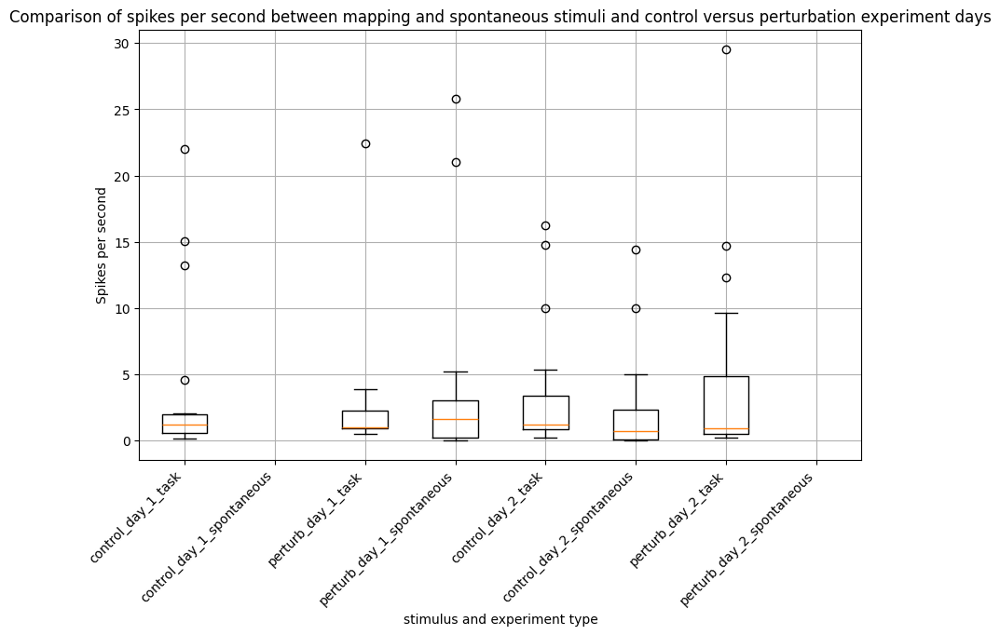

In [10]:
for result in results:
    print(f"Session ID: {result['session_id']}, Stimulus Period: {result['stim_name']}, spikes/sec: {result['spikes_per_sec']}")

control_day_1_task_results = [result['spikes_per_sec'] for result in results if result['stim_name'] == 'DynamicRouting1' and result['session_id'] == '762526_2025-03-18']
control_day_1_spontaneous_results = [result['spikes_per_sec'] for result in results if result['stim_name'] == 'Spontaneous' and result['session_id'] == '754852_2025-03-18']

control_day_2_task_results = [result['spikes_per_sec'] for result in results if result['stim_name'] == 'DynamicRouting1' and result['session_id'] == '762526_2025-03-20']
control_day_2_spontaneous_results = [result['spikes_per_sec'] for result in results if result['stim_name'] == 'Spontaneous' and result['session_id'] == '762526_2025-03-20']

perturb_day_1_task_results = [result['spikes_per_sec'] for result in results if result['stim_name'] == 'DynamicRouting1' and result['session_id'] == '762526_2025-03-19']
perturb_day_1_spontaneous_results = [result['spikes_per_sec'] for result in results if result['stim_name'] == 'Spontaneous' and result['session_id'] == '762526_2025-03-19']

perturb_day_2_task_results = [result['spikes_per_sec'] for result in results if result['stim_name'] == 'DynamicRouting1' and result['session_id'] == '762526_2025-03-21']
perturb_day_2_spontaneous_results = [result['spikes_per_sec'] for result in results if result['stim_name'] == 'Spontaneous' and result['session_id'] == '754852_2025-03-21']



plt.figure(figsize=(10, 6))
plt.boxplot([control_day_1_task_results, control_day_1_spontaneous_results, perturb_day_1_task_results, perturb_day_1_spontaneous_results, control_day_2_task_results, control_day_2_spontaneous_results, perturb_day_2_task_results, perturb_day_2_spontaneous_results], labels=['control_day_1_task', 'control_day_1_spontaneous','perturb_day_1_task','perturb_day_1_spontaneous','control_day_2_task', 'control_day_2_spontaneous', 'perturb_day_2_task', 'perturb_day_2_spontaneous'])
# plt.boxplot([control_day_1_spontaneous_results, perturb_day_1_spontaneous_results, control_day_2_spontaneous_results, perturb_day_2_spontaneous_results], labels=['control_day_1_spontaneous','perturb_day_1_spontaneous','control_day_2_spontaneous', 'perturb_day_2_spontaneous'])
plt.title('Comparison of spikes per second between mapping and spontaneous stimuli and control versus perturbation experiment days')
plt.ylabel('Spikes per second')
plt.xlabel('stimulus and experiment type')
plt.grid(True)
plt.xticks(rotation=45, ha='right')
plt.show()

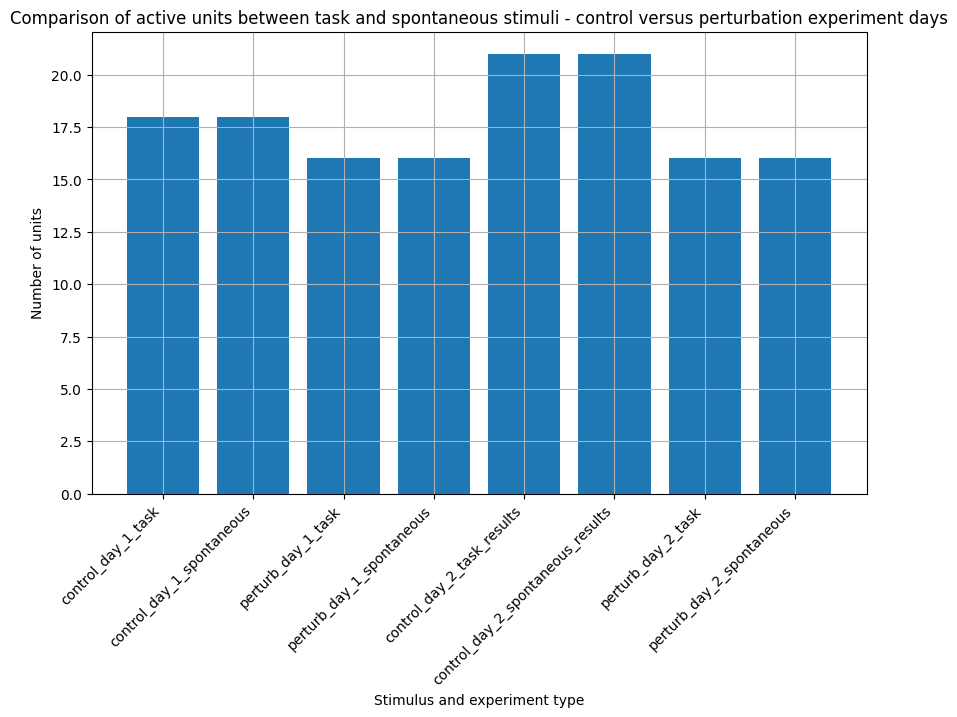

In [13]:
#active units calculation
results_df = pd.DataFrame(results)

#calculate unit counts

unique_unit_counts = results_df.groupby('session_id')['unit_id'].nunique().reset_index()
unique_unit_counts.columns = ['session_id', 'unique_unit_count']

#merge the unique unit counts back into the results df
results_df = results_df.merge(unique_unit_counts, on='session_id', how='left')

control_day_1_task_results = results_df[(results_df['stim_name'] == 'DynamicRouting1') & (results_df['session_id'] == '762526_2025-03-18')]['unique_unit_count'].unique()
control_day_1_spontaneous_results = results_df[(results_df['stim_name'] == 'Spontaneous') & (results_df['session_id'] == '762526_2025-03-18')]['unique_unit_count'].unique()

perturb_day_1_task_results = results_df[(results_df['stim_name'] == 'DynamicRouting1') & (results_df['session_id'] == '762526_2025-03-19')]['unique_unit_count'].unique()
perturb_day_1_spontaneous_results = results_df[(results_df['stim_name'] == 'Spontaneous') & (results_df['session_id'] == '762526_2025-03-19')]['unique_unit_count'].unique()

perturb_day_2_task_results = results_df[(results_df['stim_name'] == 'DynamicRouting1') & (results_df['session_id'] == '762526_2025-03-21')]['unique_unit_count'].unique()
perturb_day_2_spontaneous_results = results_df[(results_df['stim_name'] == 'Spontaneous') & (results_df['session_id'] == '762526_2025-03-21')]['unique_unit_count'].unique()

control_day_2_task_results = results_df[(results_df['stim_name'] == 'DynamicRouting1') & (results_df['session_id'] == '762526_2025-03-20')]['unique_unit_count'].unique()
control_day_2_spontaneous_results = results_df[(results_df['stim_name'] == 'Spontaneous') & (results_df['session_id'] == '762526_2025-03-20')]['unique_unit_count'].unique()

plt.figure(figsize=(10, 6))
plt.bar(['control_day_1_task', 'control_day_1_spontaneous','perturb_day_1_task', 'perturb_day_1_spontaneous', 'control_day_2_task_results','control_day_2_spontaneous_results', 'perturb_day_2_task', 'perturb_day_2_spontaneous'], 
        [control_day_1_task_results[0], control_day_1_spontaneous_results[0], perturb_day_1_task_results[0], perturb_day_1_spontaneous_results[0], control_day_2_task_results[0], control_day_2_spontaneous_results[0], perturb_day_2_task_results[0], perturb_day_2_spontaneous_results[0]])
plt.title('Comparison of active units between task and spontaneous stimuli - control versus perturbation experiment days')
plt.ylabel('Number of units')
plt.xlabel('Stimulus and experiment type')
plt.grid(True)
plt.xticks(rotation=45, ha='right')
plt.show()

In [ ]:
import pandas as pd

_, row, *_ = next(iter(pd.DataFrame([{'a': 1}, {'a': 2}]).iterrows()))
row

In [ ]:
x, y = (1, 2)
x
session_df = session.epochs[:]
session_df
# session_df.loc[(session_df['stim_name'] == "RFMapping")]

In [ ]:
session_df.query('stim_name == "RFMapping"').iloc[0]

In [ ]:
# session.sorted_data.quality_metrics_df('probeB')
session.epochs
dict(session.epochs.to_dataframe().query('stim_name == "RFMapping"').iloc[0])


In [ ]:

session = npc_sessions.Session('762526_2025-03-18')
session.epochs[:]
# session.units

In [ ]:
units = session.units[:]

In [ ]:
probe_name = "probeB"
injection_depth = 700 # um
probe_insertion_depth = 1000 # um
closest_channel = int((probe_insertion_depth - injection_depth ) / 20 * 2) # 2 channels per row, 20 um per row
below_injection = int(25 / 20 * 2)
above_injection = int(475 / 20 * 2)

(
    units
    .query('electrode_group_name == "probeB"')
    .query('peak_channel >= @closest_channel - @below_injection')    
    .query('peak_channel <= @closest_channel + @above_injection')    
).hist('peak_channel')

In [ ]:
session = npc_sessions.Session('762526_2025-03-18')

In [ ]:
session.intervals['vis_rf_mapping_trials'][:]

In [ ]:
#create an empty list to store results, make epochs of session info into a df, create list of sessions of interest, create list of stimulus periods of interest
results = []  
adaptations_sessions = ['762526_2025-03-18','762526_2025-03-19', '762526_2025-03-20', '762526_2025-03-21']
stim_names = ['DynamicRouting1']
all_unit_ids = set()

#add parameters for analysis: calculate the range of channels around the peak channel at injection depth
injection_depth = 700 # um
probe_insertion_depth = 3000 # um
closest_channel = int((probe_insertion_depth - injection_depth ) / 20 * 2) # 2 channels per row, 20 um between rows
below_injection = int(500 / 20 * 2)
above_injection = int(500 / 20 * 2)

unique_units_per_session = {}

#make a loop that goes through each session in list of sessions of interest, create session_id object for easy access, then apply unit filtering metrics like the range of channels and probe of
#interest to the units, then restrict search further to stimulus periods of interest and use loop to pull out start and stop times, then create an 
#for idx, row itterrows loop to go through and apply the period constraints to the units, finally append this information to a dictionary, then append dict to results list so that the info that
#corresponds to each session is a dict nested in a list of sessions!
for session_id in adaptations_sessions:
    print(session_id)
    session = npc_sessions.Session(session_id)
    units = (
        session.units[:]
        .query('electrode_group_name == "probeE"')
        .query('peak_channel >= @closest_channel - @below_injection')    
        .query('peak_channel <= @closest_channel + @above_injection')    
    )
    unique_unit_ids = set()

    for stim_name in stim_names:
        session_epochs = session.epochs[:]
        epoch_info = dict(session_epochs.query(f'stim_name == "{stim_name}"').iloc[0])
        session.trials= session.trials[:]
        start_time = epoch_info['start_time']
        stop_time = epoch_info['stop_time']
        for _, row in units.iterrows():
            spike_times = np.array(row['spike_times'])
            times_in_epoch = spike_times[(spike_times >= start_time) & (spike_times <= stop_time)]

            result = dict(
                session_id=session_id,
                peak_channel=row['peak_channel'],
                unit_id=row['unit_id'],
                stim_name=stim_name,
                spike_count=len(times_in_epoch),
                stim_len=stop_time - start_time,
                spikes_per_sec=((len(times_in_epoch))/(stop_time - start_time)),
                )
            
            unique_unit_ids.add(row['unit_id'])
            results.append(result)

unique_units_per_session[session_id] = len(unique_unit_ids)

results_df = pd.DataFrame(results)
print(results_df)

In [34]:
session.epochs[:]

,start_time,stop_time,stim_name,notes,interval_names,tags
id,,,,,,
0,42.73131,644.688149,Spontaneous,,[spontaneous_trials],[spontaneous]
1,655.64460,4297.601120,DynamicRouting1,,"[trials, performance]","[task, rewards]"


In [33]:
session.trials[:]

,start_time,stop_time,quiescent_start_time,quiescent_stop_time,stim_start_time,stim_stop_time,response_window_start_time,response_window_stop_time,task_control_response_time,response_time,...,is_aud_target,is_vis_target,is_nontarget,is_aud_nontarget,is_vis_nontarget,is_vis_context,is_aud_context,is_context_switch,is_repeat,is_opto
id,,,,,,,,,,,,,,,,,,,,,
0,661.83888,667.34343,661.83888,663.34012,663.348020,663.848020,663.42350,664.34095,663.59032,663.58479,...,True,False,False,False,False,False,True,False,False,False
1,667.99401,673.49861,667.99401,669.49535,669.502680,670.002680,669.57868,670.49611,669.71209,669.70684,...,True,False,False,False,False,False,True,False,False,False
2,674.09910,679.60373,674.09910,675.60035,675.608540,676.108540,675.68378,676.60120,676.00075,675.98596,...,True,False,False,False,False,False,True,False,False,False
3,680.63793,686.14255,680.63793,682.13919,682.146490,682.646490,682.22262,683.14006,682.38954,682.38502,...,True,False,False,False,False,False,True,False,False,False
4,687.71050,693.21518,687.71050,689.21226,689.220200,689.720200,689.29519,690.21264,689.51206,689.50015,...,True,False,False,False,False,False,True,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
535,4260.53685,4266.07486,4260.53685,4262.03807,4262.068443,4262.585623,4262.12155,4263.05558,4262.52193,4262.50623,...,False,True,False,False,False,True,False,False,False,False
536,4266.55855,4272.07985,4266.55855,4268.05983,4268.090357,4268.590787,4268.14326,4269.06067,4268.39339,4268.39186,...,False,False,True,False,True,True,False,False,False,False
537,4273.88135,4279.38598,4273.88135,4275.38260,4275.390270,4275.890270,4275.46600,4276.38344,4275.66615,4275.66088,...,True,False,False,False,False,True,False,False,False,False


In [37]:
#filter for is_target and the start - stop times

# vis_target= session.trials['is_vis_target' == True]

# print(vis_target['start_time'])

vis_target = (
        session.trials[:]
        .query('is_vis_target == True')
    )
# print(vis_target)
#extract start and stop times
start_times = vis_target['stim_start_time']
stop_times = vis_target['stim_stop_time']

print(type(start_times))
# print(stop_times)
#apply start and stop times as a filter to units
#subtract 1st stop from 1st start, then next stop from next start,



<class 'pandas.core.series.Series'>


In [98]:
#create an empty list to store results, make epochs of session info into a df, create list of sessions of interest, create list of stimulus periods of interest
stimulus_evoked_results = []  
adaptations_sessions = ['762526_2025-03-18','762526_2025-03-19', '762526_2025-03-20', '762526_2025-03-21']
stim_names = ['DynamicRouting1']
all_unit_ids = set()
electrode_groups = ["probeE", "probeB", "probeC"]

#add parameters for analysis: calculate the range of channels around the peak channel at injection depth
injection_depth = 700 # um
probe_insertion_depth = 3000 # um
closest_channel = int((probe_insertion_depth - injection_depth ) / 20 * 2) # 2 channels per row, 20 um between rows
below_injection = int(700 / 20 * 2)
above_injection = int(300 / 20 * 2)

unique_units_per_session = {}

unique_unit_ids = set()

#make a loop that goes through each session in list of sessions of interest, create session_id object for easy access, then apply unit filtering metrics like the range of channels and probe of
#interest to the units, then restrict search further to stimulus periods of interest and use loop to pull out start and stop times, then create an 
#for idx, row itterrows loop to go through and apply the period constraints to the units, finally append this information to a dictionary, then append dict to results list so that the info that
#corresponds to each session is a dict nested in a list of sessions!

    #this part selects the start and stop times that correspond to vis target stimulus presentation
    #then it zips the first value of each so that you get time windows where vis target was presented
    #next it applies those time windows to the units table and divides # of spikes within the time 
    #window by the length of the time window yielding active units during stim presentation & firing rate :)

vis_target = (session.trials[:].query('is_vis_target == True'))
start_time = vis_target['stim_start_time']
stop_time = vis_target['stim_stop_time']

for session_id in adaptations_sessions:
    print(session_id)
    session = npc_sessions.Session(session_id)

    for electrode in electrode_groups:
        units = (
            session.units[:]
            .query(f'electrode_group_name == "{electrode}"')
            .query(('amplitude_cutoff < 0.1') and ('presence_ratio >= 0.7') and ('isi_violations_ratio < 0.5'))
            .query('peak_channel >= @closest_channel - @below_injection')    
            .query('peak_channel <= @closest_channel + @above_injection')    
     )

        for start_time, stop_time in zip(start_times, stop_times):
                for _, row in units.iterrows():
                    spike_times = np.array(row['spike_times'])
                    times_in_epoch = spike_times[(spike_times >= start_time) & (spike_times <= stop_time)]

                    result_2 = dict(
                        session_id=session_id,
                        peak_channel=row['peak_channel'],
                        unit_id=row['unit_id'],
                        stim_name=stim_name,
                        spike_count=len(times_in_epoch),
                        stim_len=stop_time - start_time,
                        spikes_per_sec=((len(times_in_epoch))/(stop_time - start_time)),
                            )
                    unique_units_per_session[session_id] = len(unique_unit_ids)
                    unique_unit_ids.add(row['unit_id'])
                    stimulus_evoked_results.append(result_2)
                    # print(result)



stimulus_evoked_results_df = pd.DataFrame(stimulus_evoked_results)
stimulus_evoked_results_df[(stimulus_evoked_results_df['spike_count'] != 0)]
print(stimulus_evoked_results_df)

762526_2025-03-18


fetching units: 100%|█████████████████████████| 3/3 [00:12<00:00,  4.04s/device]
c:\Users\vayle.lafehr\AppData\Local\anaconda3\envs\dr_analysis\Lib\site-packages\numcodecs\abc.py:107: UserWarning: Multi-threading is supported for wavpack version>=5.6.4, but current version is 5.5.0. Parallel decoding will not be available.
  return cls(**config)
c:\Users\vayle.lafehr\AppData\Local\anaconda3\envs\dr_analysis\Lib\site-packages\numcodecs\abc.py:107: UserWarning: Multi-threading is supported for wavpack version>=5.6.4, but current version is 5.5.0. Parallel decoding will not be available.
  return cls(**config)
c:\Users\vayle.lafehr\AppData\Local\anaconda3\envs\dr_analysis\Lib\site-packages\numcodecs\abc.py:107: UserWarning: Multi-threading is supported for wavpack version>=5.6.4, but current version is 5.5.0. Parallel decoding will not be available.
  return cls(**config)


762526_2025-03-19


fetching units: 100%|█████████████████████████| 3/3 [00:15<00:00,  5.06s/device]
c:\Users\vayle.lafehr\AppData\Local\anaconda3\envs\dr_analysis\Lib\site-packages\numcodecs\abc.py:107: UserWarning: Multi-threading is supported for wavpack version>=5.6.4, but current version is 5.5.0. Parallel decoding will not be available.
  return cls(**config)
c:\Users\vayle.lafehr\AppData\Local\anaconda3\envs\dr_analysis\Lib\site-packages\numcodecs\abc.py:107: UserWarning: Multi-threading is supported for wavpack version>=5.6.4, but current version is 5.5.0. Parallel decoding will not be available.
  return cls(**config)
c:\Users\vayle.lafehr\AppData\Local\anaconda3\envs\dr_analysis\Lib\site-packages\numcodecs\abc.py:107: UserWarning: Multi-threading is supported for wavpack version>=5.6.4, but current version is 5.5.0. Parallel decoding will not be available.
  return cls(**config)


762526_2025-03-20


fetching units: 100%|█████████████████████████| 3/3 [00:14<00:00,  4.82s/device]
c:\Users\vayle.lafehr\AppData\Local\anaconda3\envs\dr_analysis\Lib\site-packages\numcodecs\abc.py:107: UserWarning: Multi-threading is supported for wavpack version>=5.6.4, but current version is 5.5.0. Parallel decoding will not be available.
  return cls(**config)
c:\Users\vayle.lafehr\AppData\Local\anaconda3\envs\dr_analysis\Lib\site-packages\numcodecs\abc.py:107: UserWarning: Multi-threading is supported for wavpack version>=5.6.4, but current version is 5.5.0. Parallel decoding will not be available.
  return cls(**config)
c:\Users\vayle.lafehr\AppData\Local\anaconda3\envs\dr_analysis\Lib\site-packages\numcodecs\abc.py:107: UserWarning: Multi-threading is supported for wavpack version>=5.6.4, but current version is 5.5.0. Parallel decoding will not be available.
  return cls(**config)


762526_2025-03-21


fetching units: 100%|█████████████████████████| 3/3 [00:11<00:00,  3.99s/device]
c:\Users\vayle.lafehr\AppData\Local\anaconda3\envs\dr_analysis\Lib\site-packages\numcodecs\abc.py:107: UserWarning: Multi-threading is supported for wavpack version>=5.6.4, but current version is 5.5.0. Parallel decoding will not be available.
  return cls(**config)
c:\Users\vayle.lafehr\AppData\Local\anaconda3\envs\dr_analysis\Lib\site-packages\numcodecs\abc.py:107: UserWarning: Multi-threading is supported for wavpack version>=5.6.4, but current version is 5.5.0. Parallel decoding will not be available.
  return cls(**config)
c:\Users\vayle.lafehr\AppData\Local\anaconda3\envs\dr_analysis\Lib\site-packages\numcodecs\abc.py:107: UserWarning: Multi-threading is supported for wavpack version>=5.6.4, but current version is 5.5.0. Parallel decoding will not be available.
  return cls(**config)


              session_id  peak_channel                  unit_id  \
0      762526_2025-03-18           194   762526_2025-03-18_E-54   
1      762526_2025-03-18           198   762526_2025-03-18_E-57   
2      762526_2025-03-18           202   762526_2025-03-18_E-58   
3      762526_2025-03-18           206   762526_2025-03-18_E-59   
4      762526_2025-03-18           208   762526_2025-03-18_E-60   
...                  ...           ...                      ...   
39873  762526_2025-03-21           229   762526_2025-03-21_C-69   
39874  762526_2025-03-21           234   762526_2025-03-21_C-75   
39875  762526_2025-03-21           177  762526_2025-03-21_C-143   
39876  762526_2025-03-21           218  762526_2025-03-21_C-152   
39877  762526_2025-03-21           234  762526_2025-03-21_C-156   

             stim_name  spike_count  stim_len  spikes_per_sec  
0      DynamicRouting1            1   0.50036        1.998561  
1      DynamicRouting1           14   0.50036       27.979855  
2  

In [99]:
stimulus_evoked_results_df = pd.DataFrame(stimulus_evoked_results)
stimulus_evoked_results_df = stimulus_evoked_results_df[(stimulus_evoked_results_df['spike_count'] != 0)]
print(stimulus_evoked_results_df)

              session_id  peak_channel                  unit_id  \
0      762526_2025-03-18           194   762526_2025-03-18_E-54   
1      762526_2025-03-18           198   762526_2025-03-18_E-57   
2      762526_2025-03-18           202   762526_2025-03-18_E-58   
3      762526_2025-03-18           206   762526_2025-03-18_E-59   
4      762526_2025-03-18           208   762526_2025-03-18_E-60   
...                  ...           ...                      ...   
39865  762526_2025-03-21           189   762526_2025-03-21_C-55   
39866  762526_2025-03-21           189   762526_2025-03-21_C-56   
39871  762526_2025-03-21           220   762526_2025-03-21_C-66   
39872  762526_2025-03-21           221   762526_2025-03-21_C-67   
39875  762526_2025-03-21           177  762526_2025-03-21_C-143   

             stim_name  spike_count  stim_len  spikes_per_sec  
0      DynamicRouting1            1   0.50036        1.998561  
1      DynamicRouting1           14   0.50036       27.979855  
2  

           session_id  unique_unit_count probe_letter
0   762526_2025-03-18                 25            B
1   762526_2025-03-19                 53            B
2   762526_2025-03-20                 69            B
3   762526_2025-03-21                  4            B
4   762526_2025-03-18                 20            C
5   762526_2025-03-19                 23            C
6   762526_2025-03-20                 17            C
7   762526_2025-03-21                 19            C
8   762526_2025-03-18                 18            E
9   762526_2025-03-19                 12            E
10  762526_2025-03-20                 47            E
11  762526_2025-03-21                  7            E


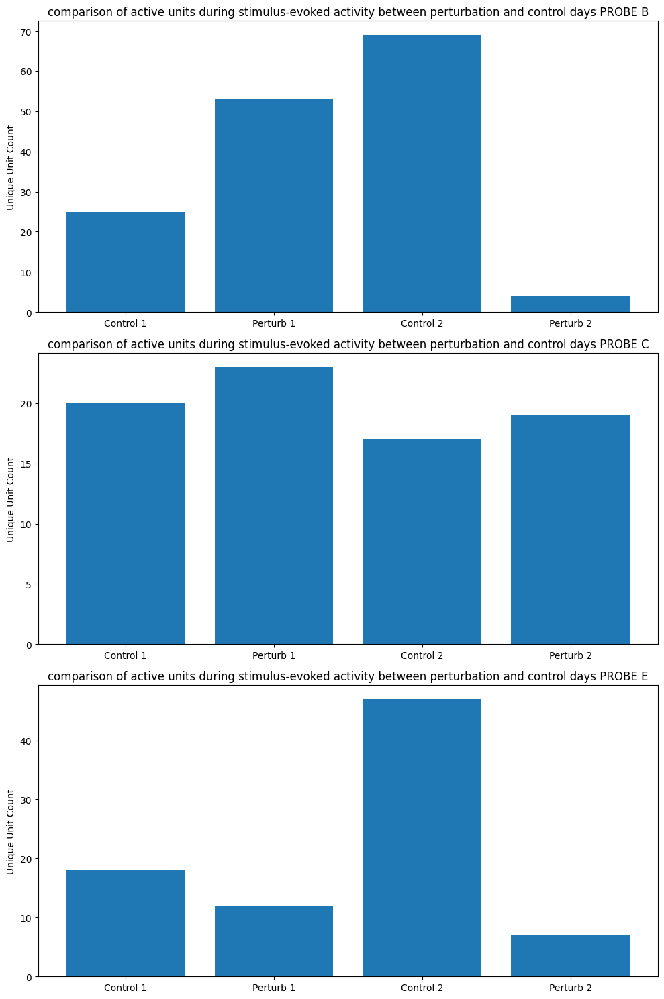

In [100]:
#plot number of active units during vis target evoked periods by probe and between sessions

stimulus_evoked_results_df = pd.DataFrame(stimulus_evoked_results)
# print(stimulus_evoked_results_df)

#calculate unit counts
unique_units = []

probe_letters = ['B', 'C', 'E']

for letter in probe_letters:
    # Filter rows where 'unit_id' contains the probe letter
    filtered_df = stimulus_evoked_results_df[stimulus_evoked_results_df['unit_id'].str.contains(letter)]
    # Count unique units for each session_id
    unique_unit_counts = filtered_df.groupby('session_id')['unit_id'].nunique().reset_index()
    unique_unit_counts.columns = ['session_id', 'unique_unit_count']
    unique_unit_counts['probe_letter'] = letter
    unique_units.append(unique_unit_counts)

# Convert the list of DataFrames to a single DataFrame
unique_units_df = pd.concat(unique_units, ignore_index=True)

print(unique_units_df)


# Example data
b_units_control_1 = unique_units_df[(unique_units_df['probe_letter'] == 'B') & (unique_units_df['session_id'] == '762526_2025-03-18')]['unique_unit_count']
e_units_control_1 = unique_units_df[(unique_units_df['probe_letter'] == 'E') & (unique_units_df['session_id'] == '762526_2025-03-18')]['unique_unit_count']
c_units_control_1 = unique_units_df[(unique_units_df['probe_letter'] == 'C') & (unique_units_df['session_id'] == '762526_2025-03-18')]['unique_unit_count']

b_units_perturb_1 = unique_units_df[(unique_units_df['probe_letter'] == 'B') & (unique_units_df['session_id'] == '762526_2025-03-19')]['unique_unit_count']
e_units_perturb_1 = unique_units_df[(unique_units_df['probe_letter'] == 'E') & (unique_units_df['session_id'] == '762526_2025-03-19')]['unique_unit_count']
c_units_perturb_1 = unique_units_df[(unique_units_df['probe_letter'] == 'C') & (unique_units_df['session_id'] == '762526_2025-03-19')]['unique_unit_count']

b_units_control_2 = unique_units_df[(unique_units_df['probe_letter'] == 'B') & (unique_units_df['session_id'] == '762526_2025-03-20')]['unique_unit_count']
e_units_control_2 = unique_units_df[(unique_units_df['probe_letter'] == 'E') & (unique_units_df['session_id'] == '762526_2025-03-20')]['unique_unit_count']
c_units_control_2 = unique_units_df[(unique_units_df['probe_letter'] == 'C') & (unique_units_df['session_id'] == '762526_2025-03-20')]['unique_unit_count']

b_units_perturb_2 = unique_units_df[(unique_units_df['probe_letter'] == 'B') & (unique_units_df['session_id'] == '762526_2025-03-21')]['unique_unit_count']
e_units_perturb_2 = unique_units_df[(unique_units_df['probe_letter'] == 'E') & (unique_units_df['session_id'] == '762526_2025-03-21')]['unique_unit_count']
c_units_perturb_2 = unique_units_df[(unique_units_df['probe_letter'] == 'C') & (unique_units_df['session_id'] == '762526_2025-03-21')]['unique_unit_count']
# print(b_units_control_1)

#make plots
fig, axs = plt.subplots(3, 1, figsize=(10, 15))

# Plot for probe B
axs[0].bar(['Control 1', 'Perturb 1', 'Control 2', 'Perturb 2'], [b_units_control_1.values[0], b_units_perturb_1.values[0], b_units_control_2.values[0], b_units_perturb_2.values[0]])
axs[0].set_title('comparison of active units during stimulus-evoked activity between perturbation and control days PROBE B')
axs[0].set_ylabel('Unique Unit Count')


# Plot for probe C
axs[1].bar(['Control 1', 'Perturb 1', 'Control 2', 'Perturb 2'], [c_units_control_1.values[0], c_units_perturb_1.values[0], c_units_control_2.values[0], c_units_perturb_2.values[0]])
axs[1].set_title('comparison of active units during stimulus-evoked activity between perturbation and control days PROBE C')
axs[1].set_ylabel('Unique Unit Count')


# Plot for probe E
axs[2].bar(['Control 1', 'Perturb 1', 'Control 2', 'Perturb 2'], [e_units_control_1.values[0], e_units_perturb_1.values[0], e_units_control_2.values[0], e_units_perturb_2.values[0]])
axs[2].set_title('comparison of active units during stimulus-evoked activity between perturbation and control days PROBE E')
axs[2].set_ylabel('Unique Unit Count')



plt.tight_layout()
plt.show()

           session_id  spikes_per_sec probe_letter
0   762526_2025-03-18       12.884971            B
1   762526_2025-03-19        4.809519            B
2   762526_2025-03-20        4.083527            B
3   762526_2025-03-21        8.394493            B
4   762526_2025-03-18        5.697573            C
5   762526_2025-03-19        2.926682            C
6   762526_2025-03-20        2.869306            C
7   762526_2025-03-21        5.595795            C
8   762526_2025-03-18       13.657861            E
9   762526_2025-03-19        3.785538            E
10  762526_2025-03-20        4.282891            E
11  762526_2025-03-21        6.476009            E


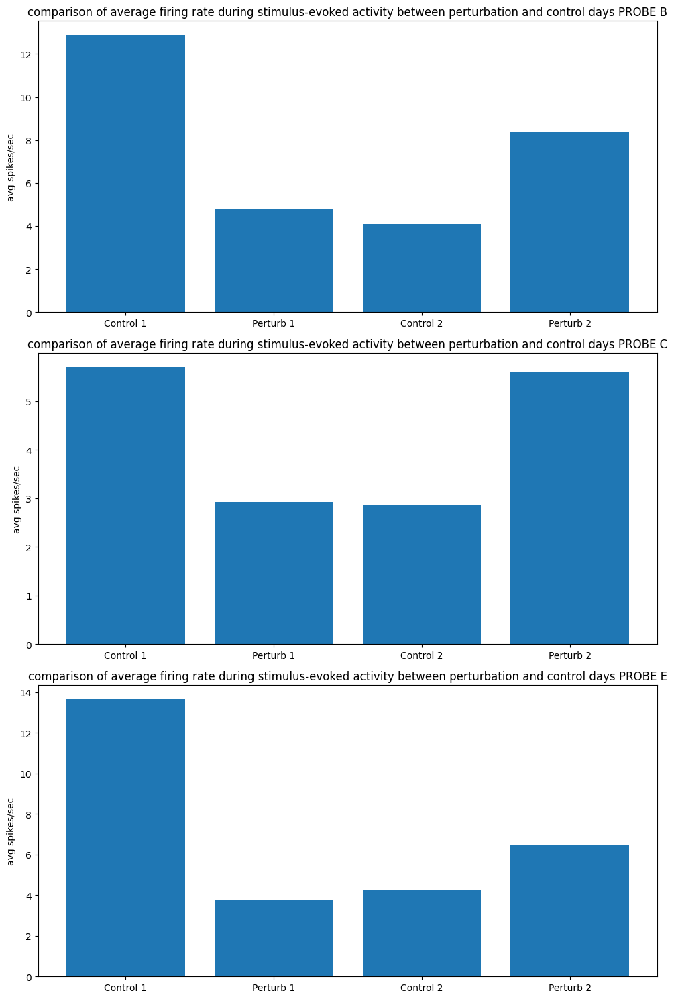

In [132]:
#plot avg. firing rate

#plot number of active units during vis target evoked periods by probe and between sessions

stimulus_evoked_results_df = pd.DataFrame(stimulus_evoked_results)
# print(stimulus_evoked_results_df)

# average_firing_rate = []

probe_letters = ['B', 'C', 'E']

average_firing_rate_ls = []

for letter in probe_letters:
    # Filter rows where 'unit_id' contains the probe letter
    filtered_df = stimulus_evoked_results_df[stimulus_evoked_results_df['unit_id'].str.contains(letter)]
    
    # Average spikes_per_sec across all units for each session_id
    average_firing_rate = filtered_df.groupby('session_id')['spikes_per_sec'].mean().reset_index()

    average_firing_rate['probe_letter'] = letter
    average_firing_rate_ls.append(average_firing_rate)

average_firing_rate_df = pd.concat(average_firing_rate_ls, ignore_index=True)

print(average_firing_rate_df)

#find data for plotting shouldve made a function for this but oh well
b_units_control_1 = average_firing_rate_df[(average_firing_rate_df['probe_letter'] == 'B') & (average_firing_rate_df['session_id'] == '762526_2025-03-18')]['spikes_per_sec']
e_units_control_1 = average_firing_rate_df[(average_firing_rate_df['probe_letter'] == 'E') & (average_firing_rate_df['session_id'] == '762526_2025-03-18')]['spikes_per_sec']
c_units_control_1 = average_firing_rate_df[(average_firing_rate_df['probe_letter'] == 'C') & (average_firing_rate_df['session_id'] == '762526_2025-03-18')]['spikes_per_sec']

b_units_perturb_1 = average_firing_rate_df[(average_firing_rate_df['probe_letter'] == 'B') & (average_firing_rate_df['session_id'] == '762526_2025-03-19')]['spikes_per_sec']
e_units_perturb_1 = average_firing_rate_df[(average_firing_rate_df['probe_letter'] == 'E') & (average_firing_rate_df['session_id'] == '762526_2025-03-19')]['spikes_per_sec']
c_units_perturb_1 = average_firing_rate_df[(average_firing_rate_df['probe_letter'] == 'C') & (average_firing_rate_df['session_id'] == '762526_2025-03-19')]['spikes_per_sec']

b_units_control_2 = average_firing_rate_df[(unique_units_df['probe_letter'] == 'B') & (average_firing_rate_df['session_id'] == '762526_2025-03-20')]['spikes_per_sec']
e_units_control_2 = average_firing_rate_df[(average_firing_rate_df['probe_letter'] == 'E') & (average_firing_rate_df['session_id'] == '762526_2025-03-20')]['spikes_per_sec']
c_units_control_2 = average_firing_rate_df[(average_firing_rate_df['probe_letter'] == 'C') & (average_firing_rate_df['session_id'] == '762526_2025-03-20')]['spikes_per_sec']

b_units_perturb_2 = average_firing_rate_df[(average_firing_rate_df['probe_letter'] == 'B') & (average_firing_rate_df['session_id'] == '762526_2025-03-21')]['spikes_per_sec']
e_units_perturb_2 = average_firing_rate_df[(average_firing_rate_df['probe_letter'] == 'E') & (average_firing_rate_df['session_id'] == '762526_2025-03-21')]['spikes_per_sec']
c_units_perturb_2 = average_firing_rate_df[(average_firing_rate_df['probe_letter'] == 'C') & (average_firing_rate_df['session_id'] == '762526_2025-03-21')]['spikes_per_sec']
# print(b_units_control_1)

# #make plots
fig, axs = plt.subplots(3, 1, figsize=(10, 15))

# Plot for probe B
axs[0].bar(['Control 1', 'Perturb 1', 'Control 2', 'Perturb 2'], [b_units_control_1.values[0], b_units_perturb_1.values[0], b_units_control_2.values[0], b_units_perturb_2.values[0]])
axs[0].set_title('comparison of average firing rate during stimulus-evoked activity between perturbation and control days PROBE B')
axs[0].set_ylabel('avg spikes/sec')


# Plot for probe C
axs[1].bar(['Control 1', 'Perturb 1', 'Control 2', 'Perturb 2'], [c_units_control_1.values[0], c_units_perturb_1.values[0], c_units_control_2.values[0], c_units_perturb_2.values[0]])
axs[1].set_title('comparison of average firing rate during stimulus-evoked activity between perturbation and control days PROBE C')
axs[1].set_ylabel('avg spikes/sec')


# Plot for probe E
axs[2].bar(['Control 1', 'Perturb 1', 'Control 2', 'Perturb 2'], [e_units_control_1.values[0], e_units_perturb_1.values[0], e_units_control_2.values[0], e_units_perturb_2.values[0]])
axs[2].set_title('comparison of average firing rate during stimulus-evoked activity between perturbation and control days PROBE E')
axs[2].set_ylabel('avg spikes/sec')



plt.tight_layout()
plt.show()

762526_2025-03-18


KeyboardInterrupt: 

In [160]:
#here i want to find firing rate per session per probe for both baseline and response stim windows. then i want to plot
#as a function of time both the baseline and response values in different colors maybe for fun then
#run a paired t test to see if there are difference between baseline and response between days

probe_letters = ['B', 'C', 'E']

baseline_vs_response_ls = []

for letter in probe_letters:
    # Filter rows where 'unit_id' contains the probe letter
    filtered_df = stimulus_evoked_results_df_2[stimulus_evoked_results_df_2['unit_id'].str.contains(letter)]
    
    # Average spikes_per_sec across all units for each session_id
    baseline_fr = filtered_df.groupby('session_id')['baseline_spikes_per_sec'].mean().reset_index()
    response_fr = filtered_df.groupby('session_id')['response_spikes_per_sec'].mean().reset_index()

    baseline_fr['probe_letter'] = letter
    response_fr['probe_letter'] = letter
    baseline_vs_response_ls.append(baseline_fr)
    baseline_vs_response_ls.append(response_fr)
#
baseline_vs_response_df = pd.concat(baseline_vs_response_ls, ignore_index=True)
# clean_baseline_vs_response_df = baseline_vs_response_df.dropna(subset=['baseline_spikes_per_sec', 'response_spikes_per_sec'])
session_df = baseline_vs_response_df.fillna(0)
print(session_df)


           session_id  baseline_spikes_per_sec probe_letter  \
0   762526_2025-03-18                 5.310236            B   
1   762526_2025-03-19                 4.706581            B   
2   762526_2025-03-20                 4.162387            B   
3   762526_2025-03-21                 8.346457            B   
4   762526_2025-03-18                 0.000000            B   
5   762526_2025-03-19                 0.000000            B   
6   762526_2025-03-20                 0.000000            B   
7   762526_2025-03-21                 0.000000            B   
8   762526_2025-03-18                 3.596457            C   
9   762526_2025-03-19                 2.740500            C   
10  762526_2025-03-20                 3.112552            C   
11  762526_2025-03-21                 5.528388            C   
12  762526_2025-03-18                 0.000000            C   
13  762526_2025-03-19                 0.000000            C   
14  762526_2025-03-20                 0.000000         

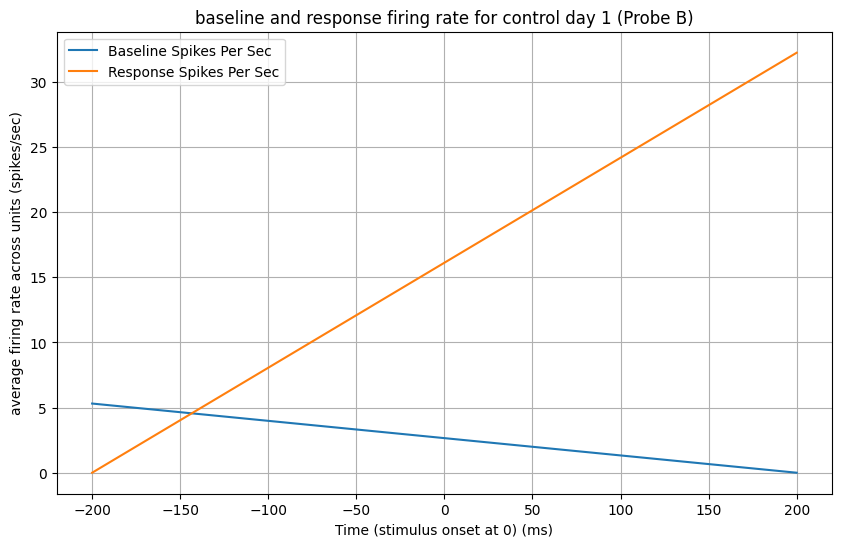

In [161]:

session_df = session_df[(session_df['session_id'] == "762526_2025-03-18") & (session_df['probe_letter'] == "B")]

# Create a time axis from -200 ms to +200 ms
time_axis = [-200 + i * (400 / (len(session_df) - 1)) for i in range(len(session_df))]

# Plotting
plt.figure(figsize=(10, 6))

# Plot baseline spikes per sec
plt.plot(time_axis, session_df['baseline_spikes_per_sec'], label='Baseline Spikes Per Sec')

# Plot response spikes per sec
plt.plot(time_axis, session_df['response_spikes_per_sec'], label='Response Spikes Per Sec')

# Adding labels and title
plt.xlabel('Time (stimulus onset at 0) (ms)')
plt.ylabel('average firing rate across units (spikes/sec)')
plt.title('baseline and response firing rate for control day 1 (Probe B)')
plt.legend()
plt.grid(True)

# Show plot
plt.show()


In [7]:
#create an empty list to store results, make epochs of session info into a df, create list of sessions of interest, create list of stimulus periods of interest
import numpy as np
import pandas as pd

spike_times_results = []  
adaptations_sessions = ['762526_2025-03-18','762526_2025-03-19', '762526_2025-03-20', '762526_2025-03-21']
stim_name = ['DynamicRouting1']
all_unit_ids = set()
electrode_groups = ["probeE", "probeB", "probeC"]

#add parameters for analysis: calculate the range of channels around the peak channel at injection depth
injection_depth = 700 # um
probe_insertion_depth = 3000 # um
closest_channel = int((probe_insertion_depth - injection_depth ) / 20 * 2) # 2 channels per row, 20 um between rows
below_injection = int(700 / 20 * 2)
above_injection = int(300 / 20 * 2)

unique_units_per_session = {}

unique_unit_ids = set()

#make a loop that goes through each session in list of sessions of interest, create session_id object for easy access, then apply unit filtering metrics like the range of channels and probe of
#interest to the units, then restrict search further to stimulus periods of interest and use loop to pull out start and stop times, then create an 
#for idx, row itterrows loop to go through and apply the period constraints to the units, finally append this information to a dictionary, then append dict to results list so that the info that
#corresponds to each session is a dict nested in a list of sessions!

    #this part selects the start and stop times that correspond to vis target stimulus presentation
    #then it zips the first value of each so that you get time windows where vis target was presented
    #next it applies those time windows to the units table and divides # of spikes within the time 
    #window by the length of the time window yielding active units during stim presentation & firing rate :)



for session_id in adaptations_sessions:
    print(session_id)
    session = npc_sessions.Session(session_id)
    vis_target = (session.trials[:].query('is_vis_target == True'))
    start_times = vis_target['stim_start_time']
    stop_times = vis_target['stim_stop_time']

    for electrode in electrode_groups:
        units = (
            session.units[:]
            .query(f'electrode_group_name == "{electrode}"')
            .query(('amplitude_cutoff < 0.1') and ('presence_ratio >= 0.7') and ('isi_violations_ratio < 0.5'))
            .query('peak_channel >= @closest_channel - @below_injection')    
            .query('peak_channel <= @closest_channel + @above_injection')    
     )

        for start_time, stop_time in zip(start_times, stop_times):
                for _, row in units.iterrows():
                    spike_times = np.array(row['spike_times']) 
                    times_in_epoch = spike_times[(spike_times >= (start_time - 0.2)) & (spike_times <= (stop_time))]

                    result_2 = dict(
                        session_id=session_id,
                        peak_channel=row['peak_channel'],
                        spike_times = row['spike_times'],
                        unit_id=row['unit_id'],
                        stim_name=stim_name,
                        spike_count=len(times_in_epoch),
                        stim_len=stop_time - start_times,
                        )
                    unique_units_per_session[session_id] = len(unique_unit_ids)
                    unique_unit_ids.add(row['unit_id'])
                    spike_times_results.append(result_2)
                    # print(result)



spike_times_results_df = pd.DataFrame(spike_times_results)
# spike_times_results_df[(spike_times_results_df['spike_count'] != 0)]
print(spike_times_results_df)

762526_2025-03-18


fetching units: 100%|█████████████████████████| 3/3 [00:11<00:00,  3.70s/device]
c:\Users\vayle.lafehr\AppData\Local\anaconda3\envs\dr_analysis\Lib\site-packages\numcodecs\abc.py:107: UserWarning: Multi-threading is supported for wavpack version>=5.6.4, but current version is 5.5.0. Parallel decoding will not be available.
  return cls(**config)
c:\Users\vayle.lafehr\AppData\Local\anaconda3\envs\dr_analysis\Lib\site-packages\numcodecs\abc.py:107: UserWarning: Multi-threading is supported for wavpack version>=5.6.4, but current version is 5.5.0. Parallel decoding will not be available.
  return cls(**config)
c:\Users\vayle.lafehr\AppData\Local\anaconda3\envs\dr_analysis\Lib\site-packages\numcodecs\abc.py:107: UserWarning: Multi-threading is supported for wavpack version>=5.6.4, but current version is 5.5.0. Parallel decoding will not be available.
  return cls(**config)


762526_2025-03-19


fetching units: 100%|█████████████████████████| 3/3 [00:15<00:00,  5.03s/device]
c:\Users\vayle.lafehr\AppData\Local\anaconda3\envs\dr_analysis\Lib\site-packages\numcodecs\abc.py:107: UserWarning: Multi-threading is supported for wavpack version>=5.6.4, but current version is 5.5.0. Parallel decoding will not be available.
  return cls(**config)
c:\Users\vayle.lafehr\AppData\Local\anaconda3\envs\dr_analysis\Lib\site-packages\numcodecs\abc.py:107: UserWarning: Multi-threading is supported for wavpack version>=5.6.4, but current version is 5.5.0. Parallel decoding will not be available.
  return cls(**config)
c:\Users\vayle.lafehr\AppData\Local\anaconda3\envs\dr_analysis\Lib\site-packages\numcodecs\abc.py:107: UserWarning: Multi-threading is supported for wavpack version>=5.6.4, but current version is 5.5.0. Parallel decoding will not be available.
  return cls(**config)


762526_2025-03-20


Stim block_idx=1 has len(diode_flips)=216853 diode flips, len(vsyncs)=216849 vsyncs:too great a difference to correct. Returning display times based on vsync + constant lag.
fetching units: 100%|█████████████████████████| 3/3 [00:15<00:00,  5.21s/device]
c:\Users\vayle.lafehr\AppData\Local\anaconda3\envs\dr_analysis\Lib\site-packages\numcodecs\abc.py:107: UserWarning: Multi-threading is supported for wavpack version>=5.6.4, but current version is 5.5.0. Parallel decoding will not be available.
  return cls(**config)
c:\Users\vayle.lafehr\AppData\Local\anaconda3\envs\dr_analysis\Lib\site-packages\numcodecs\abc.py:107: UserWarning: Multi-threading is supported for wavpack version>=5.6.4, but current version is 5.5.0. Parallel decoding will not be available.
  return cls(**config)
c:\Users\vayle.lafehr\AppData\Local\anaconda3\envs\dr_analysis\Lib\site-packages\numcodecs\abc.py:107: UserWarning: Multi-threading is supported for wavpack version>=5.6.4, but current version is 5.5.0. Parallel

762526_2025-03-21


fetching units: 100%|█████████████████████████| 3/3 [00:11<00:00,  3.72s/device]
c:\Users\vayle.lafehr\AppData\Local\anaconda3\envs\dr_analysis\Lib\site-packages\numcodecs\abc.py:107: UserWarning: Multi-threading is supported for wavpack version>=5.6.4, but current version is 5.5.0. Parallel decoding will not be available.
  return cls(**config)
c:\Users\vayle.lafehr\AppData\Local\anaconda3\envs\dr_analysis\Lib\site-packages\numcodecs\abc.py:107: UserWarning: Multi-threading is supported for wavpack version>=5.6.4, but current version is 5.5.0. Parallel decoding will not be available.
  return cls(**config)
c:\Users\vayle.lafehr\AppData\Local\anaconda3\envs\dr_analysis\Lib\site-packages\numcodecs\abc.py:107: UserWarning: Multi-threading is supported for wavpack version>=5.6.4, but current version is 5.5.0. Parallel decoding will not be available.
  return cls(**config)


              session_id  peak_channel  \
0      762526_2025-03-18           194   
1      762526_2025-03-18           198   
2      762526_2025-03-18           202   
3      762526_2025-03-18           206   
4      762526_2025-03-18           208   
...                  ...           ...   
40186  762526_2025-03-21           229   
40187  762526_2025-03-21           234   
40188  762526_2025-03-21           177   
40189  762526_2025-03-21           218   
40190  762526_2025-03-21           234   

                                             spike_times  \
0      [22.02394597554416, 24.719389709351347, 24.928...   
1      [20.351360205918898, 20.36212678098345, 20.451...   
2      [20.67415745955697, 20.823756186769653, 21.010...   
3      [20.32339377719086, 20.36049346154641, 20.4064...   
4      [20.553625151713593, 20.64675769267443, 21.031...   
...                                                  ...   
40186  [38.7475746448673, 372.26319804833264, 390.384...   
40187  [20.3032

In [178]:
spike_times_results_df
bin_size = 20 #20ms

# Filter units for probe and session
control_1_probeB = spike_times_results_df[(spike_times_results_df['unit_id'].str.contains('B')) & (spike_times_results_df['session_id'] == '762526_2025-03-18')]
# control_1_probeE = spike_times_results_df[(spike_times_results_df['unit_id'].str.contains('E')) & (spike_times_results_df['session_id'] == '762526_2025-03-18')]
# control_1_probeC = spike_times_results_df[(spike_times_results_df['unit_id'].str.contains('C')) & (spike_times_results_df['session_id'] == '762526_2025-03-18')]

# perturb_1_probeB = spike_times_results_df[(spike_times_results_df['unit_id'].str.contains('B')) & (spike_times_results_df['session_id'] == '762526_2025-03-19')]
# perturb_1_probeE = spike_times_results_df[(spike_times_results_df['unit_id'].str.contains('E')) & (spike_times_results_df['session_id'] == '762526_2025-03-19')]
# perturb_1_probeC = spike_times_results_df[(spike_times_results_df['unit_id'].str.contains('C')) & (spike_times_results_df['session_id'] == '762526_2025-03-19')]

# control_2_probeB = spike_times_results_df[(spike_times_results_df['unit_id'].str.contains('B')) & (spike_times_results_df['session_id'] == '762526_2025-03-20')]
# control_2_probeE = spike_times_results_df[(spike_times_results_df['unit_id'].str.contains('E')) & (spike_times_results_df['session_id'] == '762526_2025-03-20')]
# control_2_probeC = spike_times_results_df[(spike_times_results_df['unit_id'].str.contains('C')) & (spike_times_results_df['session_id'] == '762526_2025-03-20')]

# perturb_2_probeB = spike_times_results_df[(spike_times_results_df['unit_id'].str.contains('B')) & (spike_times_results_df['session_id'] == '762526_2025-03-21')]
# perturb_2_probeE = spike_times_results_df[(spike_times_results_df['unit_id'].str.contains('E')) & (spike_times_results_df['session_id'] == '762526_2025-03-21')]
# perturb_2_probeC = spike_times_results_df[(spike_times_results_df['unit_id'].str.contains('C')) & (spike_times_results_df['session_id'] == '762526_2025-03-21')]

# Combine spike times from all filtered units
# control_1_probeB_spike_times = np.concatenate(control_1_probeB['spike_times_evoked_by_stim'].values)
spikes_binned_all_units = []

for index, row in control_1_probeB.iterrows():
     spike_times_list = row['spike_times_evoked_by_stim']
    # spike_times = np.concatenate(row['spike_times_evoked_by_stim'])
    # print(spike_times)
#     stim_length = row['stim_length']

#     time_bins = np.arange(0, spike_times.max() + bin_size, bin_size)
#     spikes_binned, _ = np.histogram(spike_times, bins=time_bins) 

#     spikes_binned_all_units.append(spikes_binned)

# # Convert the list of binned spikes to a numpy array for further processing if needed
# spikes_binned_all_units = np.array(spikes_binned_all_units)

# print(spikes_binned_all_units)

#calculate the average spikes/len of stim within each bin

# Plotting
# plt.figure(figsize=(10, 6))
# plt.plot(time_bins[:-1], average_spike_count, label='average spikes')

# Adding labels and title
# plt.xlabel('Time (ms)')
# plt.ylabel('average spikes')
# plt.title('Average Spike Activity Over Time (Probe B, Session "762526_2025-03-18")')
# plt.legend()
# plt.grid(True)


print(spike_times_list)


[4261.95196719 4262.15709978]


In [162]:
session.units[:]

,amplitude_cutoff,amplitude_cv_median,amplitude_cv_range,amplitude_median,drift_ptp,drift_std,drift_mad,firing_range,firing_rate,isi_violations_ratio,...,cluster_id,default_qc,decoder_label,decoder_probability,amplitude,unit_id,peak_electrode,spike_times,obs_intervals,electrode_group
id,,,,,,,,,,,,,,,,,,,,,
0,0.000036,0.344981,0.252668,67.860000,9.818186,1.158352,1.10513,5.0,3.188266,0.406124,...,1,True,mua,0.71,95.804268,762526_2025-03-21_B-1,2,"[20.42210107399143, 20.581967159730347, 20.986...","[(20.250868362890344, 4299.6769176140515)]",probeB pynwb.ecephys.ElectrodeGroup at 0x21265...
1,0.000043,0.147431,0.106429,222.299990,5.897126,1.779169,1.67615,13.0,8.669589,0.001036,...,2,True,sua,0.71,288.465824,762526_2025-03-21_B-2,3,"[20.670666837409925, 20.67893347403696, 20.765...","[(20.250868362890344, 4299.6769176140515)]",probeB pynwb.ecephys.ElectrodeGroup at 0x21265...
2,0.001039,0.233245,0.109512,116.999990,NaN,NaN,NaN,2.4,0.725562,0.147959,...,4,True,sua,0.68,160.631649,762526_2025-03-21_B-4,4,"[24.692585555734816, 39.67999776054602, 39.810...","[(20.250868362890344, 4299.6769176140515)]",probeB pynwb.ecephys.ElectrodeGroup at 0x21265...
3,0.000134,0.137574,0.071656,257.400000,NaN,NaN,NaN,3.6,1.344101,0.000000,...,6,True,sua,0.89,316.747124,762526_2025-03-21_B-6,10,"[20.359867966803243, 20.374467913749374, 20.64...","[(20.250868362890344, 4299.6769176140515)]",probeB pynwb.ecephys.ElectrodeGroup at 0x21265...
4,0.000230,0.169327,0.143940,138.060000,NaN,NaN,NaN,3.6,1.756771,0.025238,...,7,True,sua,0.93,189.526054,762526_2025-03-21_B-7,10,"[20.57626718044316, 20.730599952955917, 21.087...","[(20.250868362890344, 4299.6769176140515)]",probeB pynwb.ecephys.ElectrodeGroup at 0x21265...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
196,0.000074,NaN,NaN,88.920000,NaN,NaN,NaN,26.6,6.241951,0.147939,...,126,True,sua,0.65,143.699329,762526_2025-03-21_E-126,1054,"[20.3217765260665, 20.362309518973245, 20.4018...","[(20.304276673043443, 4299.699535089799)]",probeE pynwb.ecephys.ElectrodeGroup at 0x21265...
197,0.000751,NaN,NaN,88.920000,NaN,NaN,NaN,6.0,1.184036,0.000000,...,129,True,sua,0.87,127.530006,762526_2025-03-21_E-129,785,"[20.397542556393002, 20.585507644387345, 20.61...","[(20.304276673043443, 4299.699535089799)]",probeE pynwb.ecephys.ElectrodeGroup at 0x21265...
198,0.000409,0.297279,0.088969,60.839996,NaN,NaN,NaN,3.0,1.682700,0.027509,...,133,True,sua,0.79,80.935907,762526_2025-03-21_E-133,858,"[20.559274531379447, 20.632773914076296, 20.66...","[(20.304276673043443, 4299.699535089799)]",probeE pynwb.ecephys.ElectrodeGroup at 0x21265...


In [155]:
np.sort(session.units[:].columns)

array(['amplitude', 'amplitude_cutoff', 'amplitude_cv_median',
       'amplitude_cv_range', 'amplitude_median', 'cluster_id', 'd_prime',
       'decoder_label', 'decoder_probability', 'default_qc', 'drift_mad',
       'drift_ptp', 'drift_std', 'electrode_group',
       'electrode_group_name', 'exp_decay', 'firing_range', 'firing_rate',
       'half_width', 'isi_violations_count', 'isi_violations_ratio',
       'isolation_distance', 'l_ratio', 'nn_hit_rate', 'nn_miss_rate',
       'num_negative_peaks', 'num_positive_peaks', 'num_spikes',
       'obs_intervals', 'peak_channel', 'peak_electrode',
       'peak_to_valley', 'peak_trough_ratio', 'presence_ratio',
       'recovery_slope', 'repolarization_slope', 'rp_contamination',
       'rp_violations', 'silhouette', 'sliding_rp_violation', 'snr',
       'spike_times', 'spread', 'sync_spike_2', 'sync_spike_4',
       'sync_spike_8', 'unit_id', 'velocity_above', 'velocity_below'],
      dtype=object)

In [ ]:
len(units)

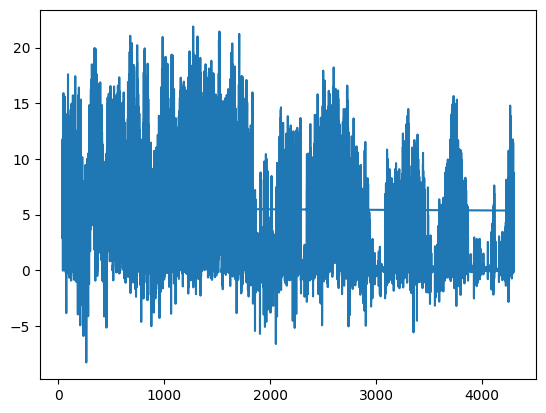

In [44]:
plt.plot(session._running_speed.timestamps, session._running_speed.data)

In [ ]:
plt.hist(units.iloc[0]['spike_times'], bins=100)

In [ ]:
units = session.units[:]
units['peak_to_valley'].hist()

In [ ]:
session.metadata

In [ ]:
dir(session)